In [10]:
import subprocess, tempfile
from pathlib import Path
from PIL import Image
from IPython.display import display

REPO       = Path("/home/math/gupta/work/greek_byzantine/greek-foundation")
TEST_DIR   = REPO / "dataset" / "calamari" / "test"
CHECKPOINT = REPO / "outputs" / "calamari-greek-bible" / "best.ckpt"

test_images = sorted(TEST_DIR.glob("*.png"))
print(f"{len(test_images)} test images")

# Predict into a temp directory (auto-cleaned, you never see it)
tmp = tempfile.mkdtemp()
cmd = [
    str(REPO / ".venv/bin/calamari-predict"),
    "--checkpoint", str(CHECKPOINT),
    "--data.images", *[str(p) for p in test_images],
    "--data.pred_extension", ".pred.txt",
    "--output_dir", tmp,
    "--predictor.device.gpus", "0",
]
proc = subprocess.run(cmd, capture_output=True, text=True)
if proc.returncode != 0:
    print(proc.stderr[-1000:])
    raise RuntimeError("calamari-predict failed")

# Read predictions into a dict {stem: predicted_text}
predictions = {}
for f in Path(tmp).glob("*.pred.txt"):
    predictions[f.stem.replace(".pred", "")] = f.read_text("utf-8").strip()

print(f"Done. {len(predictions)} predictions loaded.")

410 test images


Done. 410 predictions loaded.


 
────────────────────────────────────────────────────────────────────────────────


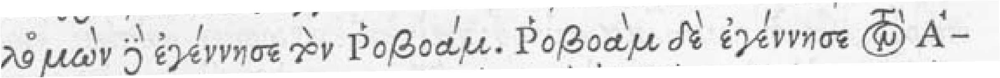

  TRUE: λο°μὼν δὲ ἐγέννησε τὸν Ῥοβοάμ. Ῥοβοὰμ δὲ ἐγέννησε τὸν Ἀ¬
  PRED: λο μὸν δὲ ἐγέννησε τὸν Ῥοβοάμ. Ἐοβοὰμ δὲ ἐγέννησε τὸν Ἀ¬
  ✗ MISMATCH
  CER: 5.36% | WER: 30.00%
 
────────────────────────────────────────────────────────────────────────────────


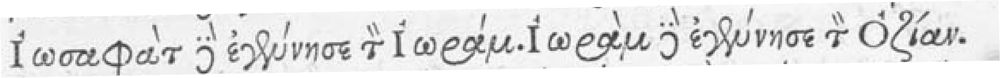

  TRUE: Ἰωσαφὰτ δὲ ἐγέννησε τὸν Ἰωράμ. Ἰωρὰμ δὲ ἐγέννησε τὸν Ὀζίαν.
  PRED: Ἰωσαφὰτ δὲ ἐγέννησε τὸν Ἰωράμ. Ἰωρὰμ δὲ ἐγένησε τὸν Ὀζίαν.
  ✗ MISMATCH
  CER: 1.69% | WER: 10.00%
 
────────────────────────────────────────────────────────────────────────────────


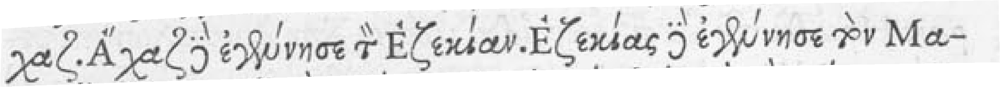

  TRUE: χαζ. Ἄχαζ δὲ ἐγέννησε τὸν Ἐζεκίαν. Ἐζεκίας δὲ ἐγέννησε τὸν Μα¬
  PRED: χαζ. Ἄχαζδὲ ἐγέννησε τὸν Ἐζεκίαν. Ἐζεκίας δὲ ἐγέννησε τὸν Μα¬
  ✗ MISMATCH
  CER: 1.61% | WER: 18.18%
 
────────────────────────────────────────────────────────────────────────────────


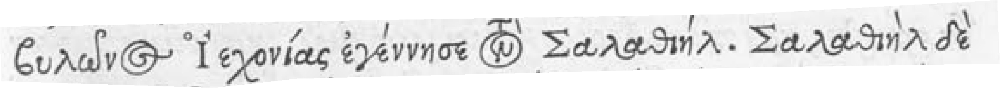

  TRUE: βυλῶνος °Ἰεχονίας ἐγέννησε τὸν Σαλαθιήλ. Σαλαθιὴλ δὲ
  PRED: βυλῶνος °Ἰεχονίας ἐγέννησε τὸν Σαλαθιήλ. Σαλαθιὴλ δὲ
  ✓ MATCH
  CER: 0.00% | WER: 0.00%
 
────────────────────────────────────────────────────────────────────────────────


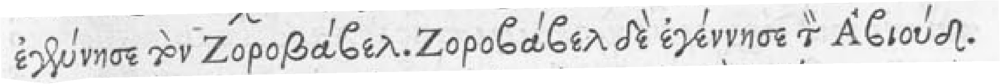

  TRUE: ἐγέννησε τὸν Ζοροβάβελ. Ζοροβάβελ δὲ ἐγέννησε τὸν Ἀβιούδ.
  PRED: ἐγέννησε τὸν Ζοροβάβελ.Ζοροβάβελ δὲ ἐγέννησε τὸν Ἀβιούδ.
  ✗ MISMATCH
  CER: 1.75% | WER: 25.00%
 
────────────────────────────────────────────────────────────────────────────────


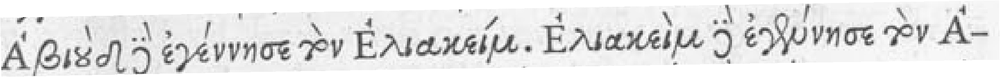

  TRUE: Ἀβιοὺδ δὲ ἐγέννησε τὸν Ἐλιακείμ. Ἐλιακεὶμ δὲ ἐγέννησε τὸν Ἀ¬
  PRED: Ἀβιὶ δ δὲ ἐγέννησε τὸν Ἐλιακείμ. Ἐλιακεὶμ δὲ ἐγέννησε τὸν Ἁ¬
  ✗ MISMATCH
  CER: 5.00% | WER: 30.00%
 
────────────────────────────────────────────────────────────────────────────────


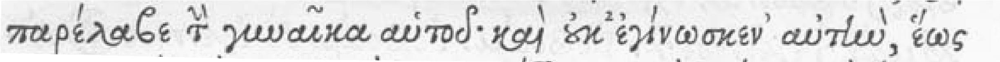

  TRUE: παρέλαβε τὴν γυναῖκα αὐτοῦ· καὶ οὐκ2 ἐγίνωσκεν᾿ αὐτὴν, ἕως
  PRED: παρέλαβε τὴν γυναῖκα αὑτοῦ· καὶ οὐκ ἐγίνωσκεν᾿ αὐτὴν, ἕως
  ✗ MISMATCH
  CER: 6.90% | WER: 22.22%
 
────────────────────────────────────────────────────────────────────────────────


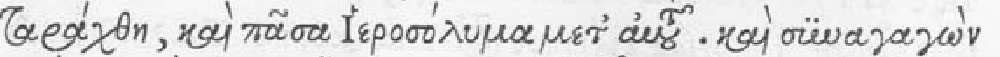

  TRUE: ταράχθη, καὶ πᾶσα Ἱεροσόλυμα μετ’ αὐτοῦ. καὶ σϋναγαγὼν
  PRED: ταράχθη, καὶ πᾶσα Ἱεροσόλυμα μετ’ αὐτοῦ. καὶ σϋναγαγὼν
  ✓ MATCH
  CER: 0.00% | WER: 0.00%
 
────────────────────────────────────────────────────────────────────────────────


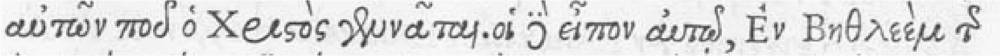

  TRUE: αὐτῶν ποῦ ὁ Χριστὸς γεννᾶται. οἱ δὲ εἶπον αὐτῷ, Ἐν Βηθλεὲμ τῆς
  PRED: αὐτῶν ποῦ ὁ Χριστὸς γεννᾶται. οἱ δὲ εἶπον αὐτῷ, Ἐν Βηθλεὲμ τῆς
  ✓ MATCH
  CER: 0.00% | WER: 0.00%
 
────────────────────────────────────────────────────────────────────────────────


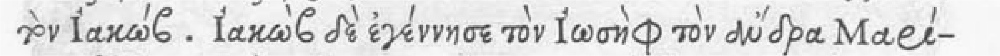

  TRUE: τὸν Ἰακώβ. Ἰακὼβ δὲ ἐγέννησε τὸν Ἰωσὴφ τὸν ἄνδρα Μαρί¬
  PRED: τὸν Ἰακώβ. Ἰακὼβ δὲ ἐγέννησε τὸν Ἰωσὴφ τὸν ἀνδρα Μαρί¬
  ✗ MISMATCH
  CER: 1.85% | WER: 10.00%
 
────────────────────────────────────────────────────────────────────────────────


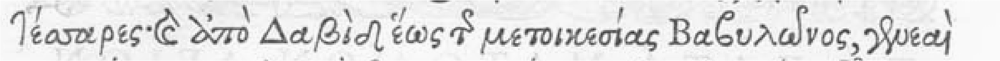

  TRUE: τέσσαρες· καὶ ἀπὸ Δαβὶδ ἕως τῆς μετοικεσίας Βαβυλῶνος, γενεαὶ
  PRED: τέσσαρε· καὶ ἀπὸ Δαβὶδ ἕως τῆς μετοικεσίας Βαβυλωῶνος, γενεαὶ
  ✗ MISMATCH
  CER: 3.28% | WER: 22.22%
 
────────────────────────────────────────────────────────────────────────────────


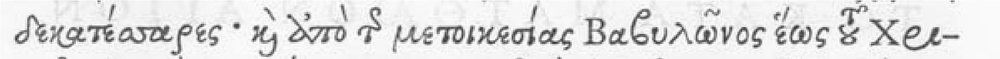

  TRUE: δεκατέσσαρες· καὶ ἀπὸ τῆς μετοικεσίας Βαβυλῶνος ἕως τοῦ Χρι¬
  PRED: δεκατέσσαρες· καὶ ἀπὸ τῆς μετοικεσίας Βαβυλῶνος ἕως τοῦ Χρι¬
  ✗ MISMATCH
  CER: 1.67% | WER: 11.11%
 
────────────────────────────────────────────────────────────────────────────────


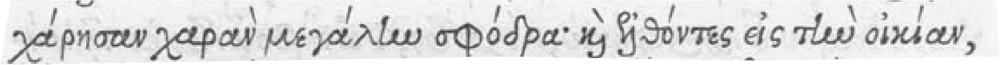

  TRUE: χάρησαν χαρὰν μεγάλην σφόδρα· καὶ ἐλθόντες εἰς τὴν οἰκίαν,
  PRED: χάρησαν χαρὰν μεγάλην σφόδρα· καὶ ἐλθόντες εἰς τὴν οἰκίαν,
  ✗ MISMATCH
  CER: 1.72% | WER: 11.11%
 
────────────────────────────────────────────────────────────────────────────────


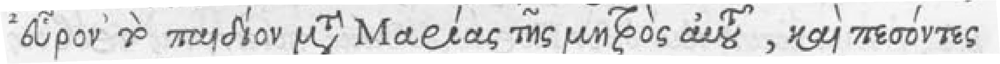

  TRUE: ²εὗρον᾿ τὸ παιδίον μετὰ Μαρίας τῆς μητρὸς αὐτοῦ, καὶ πεσόντες
  PRED: °εὗρον᾿ τὸ παιδίον μετὰ Μαρίας τῆς μητρὸς αὐτοῦ, καὶ πεσόντες
  ✗ MISMATCH
  CER: 1.64% | WER: 10.00%
 
────────────────────────────────────────────────────────────────────────────────


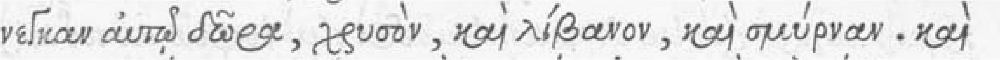

  TRUE: νεγκαν αὐτῷ δῶρα, χρυσὸν, καὶ λίβανον, καὶ σμύρναν. καὶ
  PRED: νεγκαν αὐτῷ δῶρα, χρυσὸν, καὶ λίβανον, καὶ σμύρναν. καὶ
  ✗ MISMATCH
  CER: 1.82% | WER: 0.00%
 
────────────────────────────────────────────────────────────────────────────────


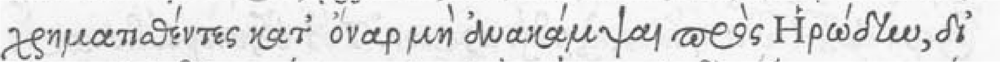

  TRUE: χρηματισθέντες κατ’ ὄναρ μὴ ἀνακάμψαι πρὸς Ἡρώδην, δι’
  PRED: χρηματισθέντες κατ’ ὄναρ μὴ ἐἀνακάμψαι πρὸς Ἡρώδην, δι’
  ✗ MISMATCH
  CER: 1.85% | WER: 12.50%
 
────────────────────────────────────────────────────────────────────────────────


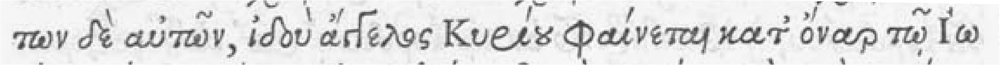

  TRUE: των δὲ αὐτῶν, ἰδοὺ ἄγγελος Κυρίου φαίνεται κατ’ ὄναρ τῷ Ἰω¬
  PRED: των δὲ αὐτῶν, ἰδοὺ ἄγγελος Κυρίου φαίνεται κατ’ ὄναρ τῷ Ἰω
  ✗ MISMATCH
  CER: 1.69% | WER: 9.09%
 
────────────────────────────────────────────────────────────────────────────────


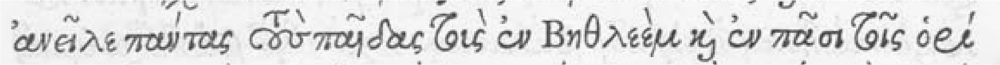

  TRUE: ἀνεῖλε πάντας τοὺς παῖδας τοὺς ἐν Βηθλεὲμ καὶ ἐν πᾶσι τοῖς ὁρί
  PRED: ἀνεῖλε πάντας τοὺς παῖδας τοὺς ἐν Βηθλεὲμ καὶ ἐν πᾶσι τοῖς ὁρί
  ✓ MATCH
  CER: 0.00% | WER: 0.00%
 
────────────────────────────────────────────────────────────────────────────────


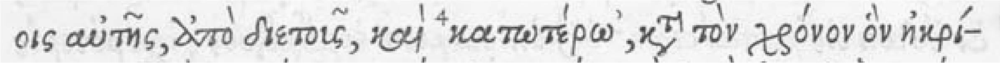

  TRUE: οις αὐτῆς, ἀπὸ διετοῦς, καὶ ⁴κατωτέρω᾿, κατὰ τὸν χρόνον ὃν ἠκρί¬
  PRED: οις αὐτῆς, ἀπὸ διετοῦς, καὶ ²κατωτέρω᾿ κατὰ τὸν χρόνον ὃν ἠκρί¬
  ✗ MISMATCH
  CER: 3.12% | WER: 9.09%
 
────────────────────────────────────────────────────────────────────────────────


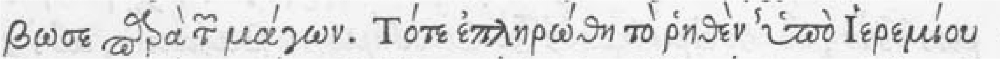

  TRUE: βωσε παρὰ τῶν μάγων. Tότε ἐπληρώθη τὸ ῥηθὲν ⁵ὑπὸ Ἰερεμίου
  PRED: βωσε παρὰ τῶν μάγων. Τότε ἐπληρώθη τὸ ῥηθὲν ³ὑπὸ Ἱερεμίου
  ✗ MISMATCH
  CER: 5.26% | WER: 30.00%
 
────────────────────────────────────────────────────────────────────────────────


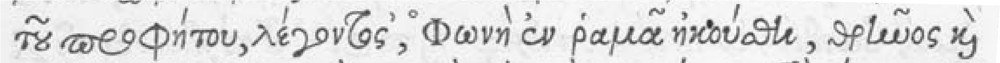

  TRUE: τοῦ προφήτου, λέγοντος᾿,° Φωνὴ ἐν ῥαμὰ ἠκούσθη, θρῆνος καὶ
  PRED: τοῦ προφήτου, λέγοντος᾿, °Φωνὴ ἐν ῥαμᾶ ἠκούσθ, θρνος καὶ
  ✗ MISMATCH
  CER: 6.90% | WER: 55.56%
 
────────────────────────────────────────────────────────────────────────────────


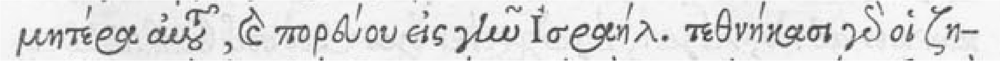

  TRUE: μητέρα αὐτοῦ, καὶ πορεύου εἰς γῆν Ἰσραήλ. τεθνήκασι γὰρ οἱ ζη¬
  PRED: μητέρα αὐτοῦ, καὶ πορεύου εἰς γῆν Ἰσραήλ. τεθνήκασι γὰρ οἱ ζη¬
  ✓ MATCH
  CER: 0.00% | WER: 0.00%
 
────────────────────────────────────────────────────────────────────────────────


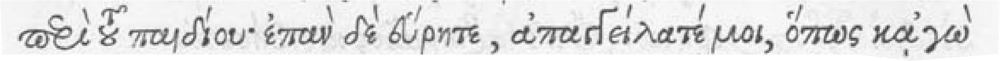

  TRUE: περὶ τοῦ παιδίου· ἐπὰν δὲ εὕρητε, ἀπαγγείλατέ μοι, ὅπως κᾀγὼ
  PRED: περὶ τοῦ παιδίου· ἐπὰν δὲ εύρητε, ἀπαγγείλατέ μοι, ὅπως κᾀγὼ
  ✗ MISMATCH
  CER: 3.33% | WER: 20.00%
 
────────────────────────────────────────────────────────────────────────────────


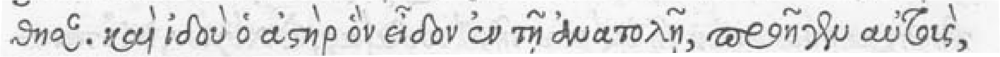

  TRUE: θησαν. καὶ ἰδοὺ ὁ ἀστὴρ ὃν εἶδον ἐν τῇ ἀνατολῇ, προῆγεν αὐτοὺς,
  PRED: θησαν. καὶ ἰδοὺ ὁ ἀστὴρ ὃν εἶδον ἐν τῇ ἀνατολῇ, προῆγεν αὐτοὺς,
  ✓ MATCH
  CER: 0.00% | WER: 0.00%
 
────────────────────────────────────────────────────────────────────────────────


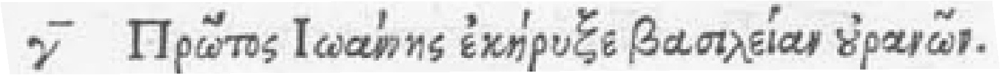

  TRUE: γ⁻ Πρῶτος Ιωάννης ἐκήρυξε βασιλείαν οὐρανῶν
  PRED: γ⁻Πρῶτος Ἰωάνης ἐκήρυξε βασιλείαν οὐρανῶν.
  ✗ MISMATCH
  CER: 6.98% | WER: 66.67%
 
────────────────────────────────────────────────────────────────────────────────


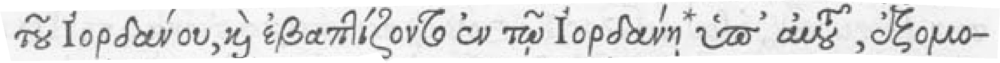

  TRUE: τοῦ Ἰορδάνου, καὶ ἐβαπτίζοντο ἐν τῷ Ἰορδάνῃ* ὑπ’ αὐτοῦ, ἐξομο¬
  PRED: τοῦ Ἰορδάνου, καὶ ἐβαπτίζοντο ἐν τῷ Ἰορδάηῃ π’ αὐτοῦ, ἐξομο¬
  ✗ MISMATCH
  CER: 4.84% | WER: 20.00%
 
────────────────────────────────────────────────────────────────────────────────


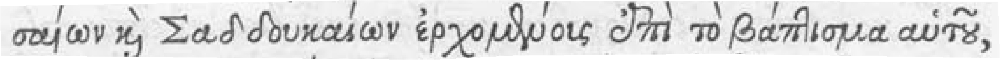

  TRUE: σαίων καὶ Σαδδουκαίων ἐρχομένους ἐπὶ τὸ βάπτισμα αὑτοῦ,
  PRED: σαίων καὶ Σαδδουκαίων ἐρχομένους ἐπὶ τὸ βάπτισμα αὑτοῦ,
  ✓ MATCH
  CER: 0.00% | WER: 0.00%
 
────────────────────────────────────────────────────────────────────────────────


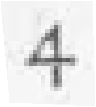

  TRUE: 4
  PRED: 4
  ✓ MATCH
  CER: 0.00% | WER: 0.00%
 
────────────────────────────────────────────────────────────────────────────────


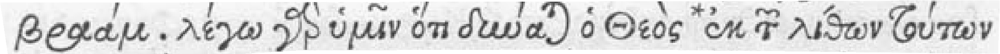

  TRUE: βραάμ. λέγω γὰρ ὑμῖν ὅτι δύναται ὁ Θεὸς *ἐκ τῶν λίθων τούτων
  PRED: βραάμ. λέγω γὰρ ὑμῖν ὅτι δύναται ὁ Θεὸς ἐκ τῶν λίθων τούτων
  ✗ MISMATCH
  CER: 1.67% | WER: 8.33%
 
────────────────────────────────────────────────────────────────────────────────


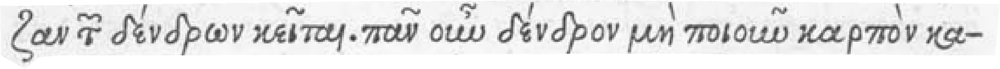

  TRUE: ζαν τῶν δένδρων κεῖται. πᾶν οὖν δένδρον μὴ ποιοῦν καρπὸν κα¬
  PRED: ζαν ῶν δένδρων κεῖται. πᾶν οὖν δένδρον μὴ ποιοῦν καρπὸν κα¬
  ✗ MISMATCH
  CER: 1.67% | WER: 9.09%


In [29]:
# Helper functions for CER and WER
from difflib import SequenceMatcher

def calculate_cer(ground_truth, prediction):
    """Calculate Character Error Rate"""
    if len(ground_truth) == 0:
        return 100.0 if len(prediction) > 0 else 0.0
    
    matcher = SequenceMatcher(None, ground_truth, prediction)
    matches = sum(block.size for block in matcher.get_matching_blocks())
    errors = max(len(ground_truth), len(prediction)) - matches
    cer = (errors / len(ground_truth)) * 100
    return cer

def calculate_wer(ground_truth, prediction):
    """Calculate Word Error Rate"""
    gt_words = ground_truth.split()
    pred_words = prediction.split()
    
    if len(gt_words) == 0:
        return 100.0 if len(pred_words) > 0 else 0.0
    
    matcher = SequenceMatcher(None, gt_words, pred_words)
    matches = sum(block.size for block in matcher.get_matching_blocks())
    errors = max(len(gt_words), len(pred_words)) - matches
    wer = (errors / len(gt_words)) * 100
    return wer

# Show: image | ground truth | prediction with metrics
N = 30  # number of samples to show

sep_line = '\u2500' * 80
check_mark = '\u2713'
cross_mark = '\u2717'

for img_path in test_images[:N]:
    gt   = (TEST_DIR / f"{img_path.stem}.gt.txt").read_text("utf-8").strip()
    pred = predictions.get(img_path.stem, "\u27e8no prediction\u27e9")

    print(f" \n{sep_line}")
    display(Image.open(img_path))
    print(f"  TRUE: {gt}")
    print(f"  PRED: {pred}")
    match_status = f"{check_mark} MATCH" if gt == pred else f"{cross_mark} MISMATCH"
    print(f"  {match_status}")
    
    # Calculate and display error rates
    cer = calculate_cer(gt, pred)
    wer = calculate_wer(gt, pred)
    print(f"  CER: {cer:.2f}% | WER: {wer:.2f}%")

Found 1 uploaded images


Done. 1 predictions loaded for uploads.
 
────────────────────────────────────────────────────────────────────────────────
  FILE: Screenshot 2026-05-07 at 11.31.09 AM.png


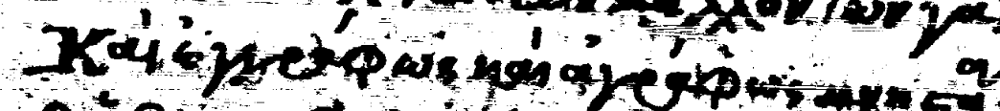

  PREDICTION: ⟨no prediction⟩


In [20]:
# Predict on uploaded images (no ground truth)
# Manually specify image paths (relative to backend/uploads)
upload_images = [
    REPO / "backend" / "uploads" / "Screenshot 2026-05-07 at 11.31.09 AM.png",

    # Add more image paths here as needed
]

# Filter to only existing files
upload_images = [p for p in upload_images if p.exists()]

print(f"Found {len(upload_images)} uploaded images")

if len(upload_images) > 0:
    # First, run calamari-predict on uploaded images
    tmp_upload = tempfile.mkdtemp()
    cmd_upload = [
        str(REPO / ".venv/bin/calamari-predict"),
        "--checkpoint", str(CHECKPOINT),
        "--data.images", *[str(p) for p in upload_images],
        "--data.pred_extension", ".pred.txt",
        "--output_dir", tmp_upload,
        "--predictor.device.gpus", "0",
    ]
    proc_upload = subprocess.run(cmd_upload, capture_output=True, text=True)
    if proc_upload.returncode != 0:
        print("Error:", proc_upload.stderr[-500:])
    else:
        # Load upload predictions
        upload_predictions = {}
        for f in Path(tmp_upload).glob("*.pred.txt"):
            upload_predictions[f.stem.replace(".pred", "")] = f.read_text("utf-8").strip()
        
        print(f"Done. {len(upload_predictions)} predictions loaded for uploads.")
        
        # Display uploaded images with predictions
        sep_line = '\u2500' * 80
        
        for img_path in upload_images:
            pred = upload_predictions.get(img_path.stem, "\u27e8no prediction\u27e9")
            
            print(f" \n{sep_line}")
            print(f"  FILE: {img_path.name}")
            display(Image.open(img_path))
            print(f"  PREDICTION: {pred}")
else:
    print("No images found")

Found 3 uploaded images


Prediction files found: 3
  File: image_5.pred.txt, stem: image_5.pred, stem after replace: image_5
  File: image_4.pred.txt, stem: image_4.pred, stem after replace: image_4
  File: image_3.pred.txt, stem: image_3.pred, stem after replace: image_3
Done. 3 predictions loaded for uploads.
Dictionary keys: ['image_5', 'image_4', 'image_3']
Looking up: image_4
 
────────────────────────────────────────────────────────────────────────────────
  FILE: image_4.png


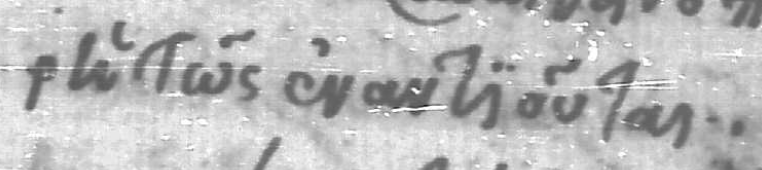

  PREDICTION: νεεν οιταα
Looking up: image_5
 
────────────────────────────────────────────────────────────────────────────────
  FILE: image_5.png


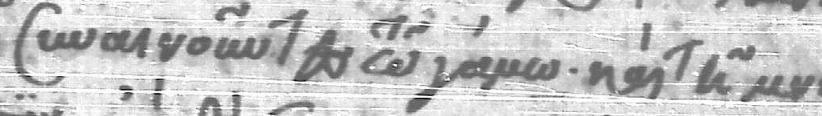

  PREDICTION: σααει κα τωταγκυ.κενεὸν
Looking up: image_3
 
────────────────────────────────────────────────────────────────────────────────
  FILE: image_3.png


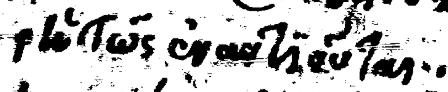

  PREDICTION: ς ἐακαι.


In [28]:
# Predict on uploaded images (no ground truth) - WITH DEBUG
upload_images = [
    REPO / "backend" / "uploads" / "image_4.png",
    REPO / "backend" / "uploads" / "image_5.png",
    REPO / "backend" / "uploads" / "image_3.png",
]

# Filter to only existing files
upload_images = [p for p in upload_images if p.exists()]

print(f"Found {len(upload_images)} uploaded images")

if len(upload_images) > 0:
    # First, run calamari-predict on uploaded images
    tmp_upload = tempfile.mkdtemp()
    cmd_upload = [
        str(REPO / ".venv/bin/calamari-predict"),
        "--checkpoint", str(CHECKPOINT),
        "--data.images", *[str(p) for p in upload_images],
        "--data.pred_extension", ".pred.txt",
        "--output_dir", tmp_upload,
        "--predictor.device.gpus", "0",
    ]
    proc_upload = subprocess.run(cmd_upload, capture_output=True, text=True)
    if proc_upload.returncode != 0:
        print("Error:", proc_upload.stderr[-500:])
    else:
        # Load upload predictions
        upload_predictions = {}
        pred_files = list(Path(tmp_upload).glob("*.pred.txt"))
        print(f"Prediction files found: {len(pred_files)}")
        for f in pred_files:
            print(f"  File: {f.name}, stem: {f.stem}, stem after replace: {f.stem.replace('.pred', '')}")
            upload_predictions[f.stem.replace(".pred", "")] = f.read_text("utf-8").strip()
        
        print(f"Done. {len(upload_predictions)} predictions loaded for uploads.")
        print(f"Dictionary keys: {list(upload_predictions.keys())}")
        
        # Display uploaded images with predictions
        sep_line = '\u2500' * 80
        
        for img_path in upload_images:
            print(f"Looking up: {img_path.stem}")
            pred = upload_predictions.get(img_path.stem, "\u27e8no prediction\u27e9")
            
            print(f" \n{sep_line}")
            print(f"  FILE: {img_path.name}")
            display(Image.open(img_path))
            print(f"  PREDICTION: {pred}")
else:
    print("No images found")